In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.models as models
from torch.utils.data import DataLoader

import random
import os
import copy

import torch

import sys
sys.path.append("../../")

from src.model.TransferModel import run_style_transfer
from src.dataset.dataset import ImgDataset
from src.utils.other import *

# load stuff

In [5]:
device = torch.device("cuda:2" if torch.cuda.is_available() else "cpu")
imsize = 256 if torch.cuda.is_available() else 128  # use small size if no gpu

In [6]:
content_dataset = ImgDataset("../../data/", imsize, device)
style_dataset = ImgDataset("../../data/traditional_style_images/", imsize, device)

content_loader = DataLoader(content_dataset, batch_size=1, shuffle=True)
style_loader = DataLoader(style_dataset, batch_size=1, shuffle=False)

In [7]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

In [8]:
outfolder = "../../results/traditional_style_images_256_2/"
os.system("mkdir -p " + str(outfolder))

0

# grid plot

In [6]:
max_ct = 10
max_style = len(style_dataset) + 1
max_content = len(content_dataset)

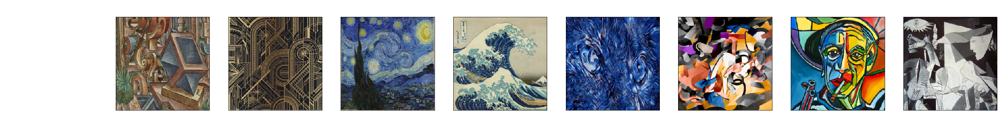

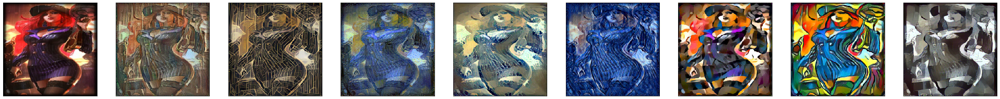

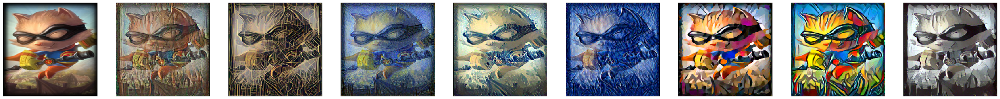

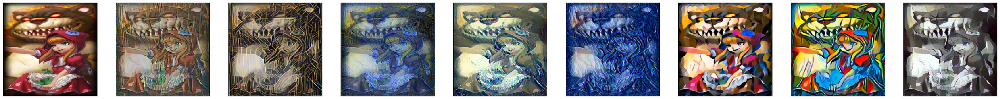

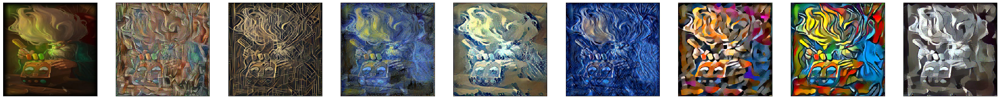

...

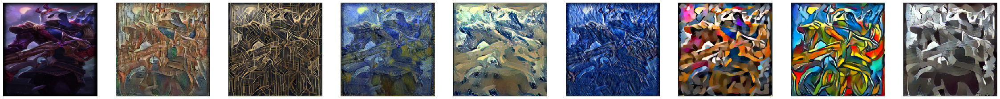

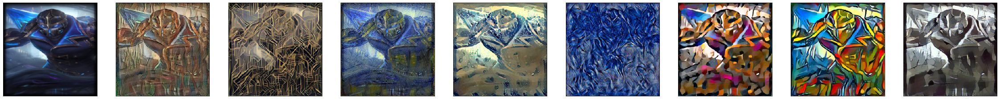

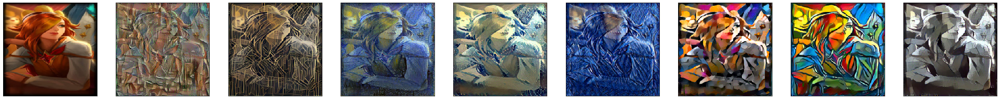

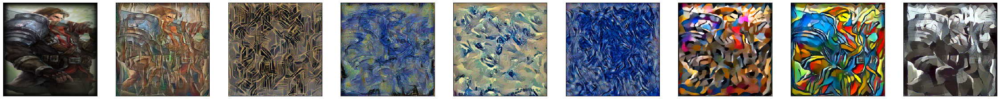

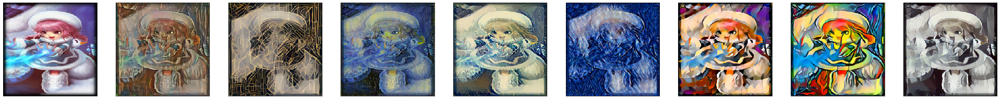

In [7]:
# make plot and disable axis bars
fig, axes = plt.subplots(1, max_style, figsize=(40, 5))
axes[0].axis('off')
for i in range(max_style):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)

# show style images
for i, style_img in enumerate(style_loader):
    imshow(style_img, axes[i + 1])
plt.savefig(outfolder + "styles")
plt.show()

for i, content_img in enumerate(content_loader):
    # make plot and disable axis bars
    fig, axes = plt.subplots(1, max_style, figsize=(40, 5))
    for j in range(max_style):
        axes[j].get_xaxis().set_visible(False)
        axes[j].get_yaxis().set_visible(False)
    
    # show content image
    imshow(content_img, axes[0])
    
    # squeeze batch dimension out
    content_img = content_img.squeeze(0)
    
    # run style transfer on each style image
    for j, style_img in enumerate(style_loader):
        # squeeze batch dim
        style_img = style_img.squeeze(0)
        # input
        input_img = content_img.clone()
        # run style transfer
        output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                                    content_img, style_img, input_img, num_steps=300,
                                    do_print=False, device=device)
        # show ouptut image
        imshow(output, axes[j + 1])
    plt.savefig(outfolder + "im_" + str(i))
    plt.show()
    # if we have done the max amount
    if i + 1 == max_ct:
        break

# pick some images to do hi-res, featured version

In [2]:
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")
imsize = 512 if torch.cuda.is_available() else 128  # use small size if no gpu

In [3]:
style_dataset = ImgDataset("../../data/traditional_style_images/", imsize, device)
style_loader = DataLoader(style_dataset, batch_size=1, shuffle=False)

## red riding annie and style image 5

### get style image

In [4]:
for i, style_img in enumerate(style_loader):
    if i == 5:
        break

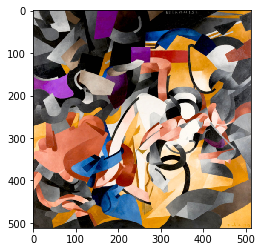

In [5]:
imshow(style_img, plt.gca())

### load stuff

In [4]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

In [6]:
outfolder = "../../results/featured/traditional_style_images_256_2/"
os.system("mkdir -p " + str(outfolder))

0

### get annie image

In [8]:
annie_path = "../../data/Annie_2-2.jpg"

In [9]:
content_img = style_dataset.load_image(annie_path, device)

### style transfer

In [11]:
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=300,
                            do_print=True, device=device)

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 129.811386 Content Loss: 12.800230

run [100]:
Style Loss : 34.430817 Content Loss: 14.365285

run [150]:
Style Loss : 17.006260 Content Loss: 14.071899

run [200]:
Style Loss : 9.732504 Content Loss: 13.757502

run [250]:
Style Loss : 6.210957 Content Loss: 13.451834

run [300]:
Style Loss : 4.368737 Content Loss: 12.892010



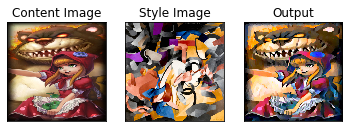

In [16]:
fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "annie")
plt.show()

## miss fortune and the last style one

In [19]:
mf_path = "../../data/missfortuneloadscreen_17.skins_missfortune_skin15_chromas-300x545.jpg"
content_img = style_dataset.load_image(mf_path, device)

for i, style_img in enumerate(style_loader):
    pass

In [20]:
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=300,
                            do_print=True, device=device)

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 132.862442 Content Loss: 19.042767

run [100]:
Style Loss : 44.277077 Content Loss: 18.662626

run [150]:
Style Loss : 28.884750 Content Loss: 17.714455

run [200]:
Style Loss : 21.815369 Content Loss: 16.848297

run [250]:
Style Loss : 16.065571 Content Loss: 16.380213

run [300]:
Style Loss : 11.427181 Content Loss: 16.031328



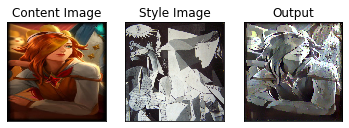

In [21]:
fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "mf")
plt.show()

## lucian high noon and second to last one

In [23]:
content_img = style_dataset.load_image("../../data/lucian-high-noon-300x545.jpg", device)
for i, style_img in enumerate(style_loader):
    if i == 6:
        break

In [24]:
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=300,
                            do_print=True, device=device)

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 1434.199341 Content Loss: 29.859371

run [100]:
Style Loss : 215.117798 Content Loss: 31.246943

run [150]:
Style Loss : 86.656654 Content Loss: 31.740265

run [200]:
Style Loss : 39.398563 Content Loss: 32.009438

run [250]:
Style Loss : 22.642862 Content Loss: 31.530783

run [300]:
Style Loss : 14.734157 Content Loss: 30.935204



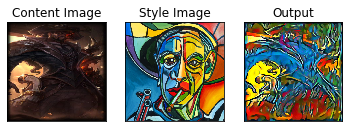

In [25]:
fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "high_noon_lucian")
plt.show()

### kennen

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 1641.056396 Content Loss: 30.094206

run [100]:
Style Loss : 166.965622 Content Loss: 31.499680

run [150]:
Style Loss : 67.479836 Content Loss: 31.938110

run [200]:
Style Loss : 30.078299 Content Loss: 32.241798

run [250]:
Style Loss : 15.346261 Content Loss: 32.012203

run [300]:
Style Loss : 8.685400 Content Loss: 31.377113



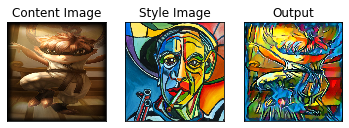

In [10]:
content_img = style_dataset.load_image("../../data/Kennen_3.jpg", device)
for i, style_img in enumerate(style_loader):
    if i == 6:
        break
        
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=300,
                            do_print=True, device=device)

fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "kennen")
plt.show()

# lux

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 1590.985474 Content Loss: 62.397816

run [100]:
Style Loss : 367.992615 Content Loss: 62.658855

run [150]:
Style Loss : 135.001587 Content Loss: 62.209770

run [200]:
Style Loss : 66.340111 Content Loss: 61.405121

run [250]:
Style Loss : 37.773811 Content Loss: 60.523006

run [300]:
Style Loss : 24.268539 Content Loss: 59.473305



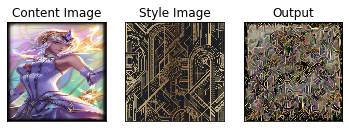

In [11]:
content_img = style_dataset.load_image("../../data/lux-elementalist-300x545.jpg", device)
for i, style_img in enumerate(style_loader):
    if i == 1:
        break
        
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=300,
                            do_print=True, device=device)

fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "lux")
plt.show()

# teemo

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 123.332504 Content Loss: 30.957752

run [100]:
Style Loss : 42.078636 Content Loss: 29.836502

run [150]:
Style Loss : 27.492996 Content Loss: 28.334085

run [200]:
Style Loss : 19.418879 Content Loss: 26.536400

run [250]:
Style Loss : 14.264544 Content Loss: 25.021759

run [300]:
Style Loss : 9.845476 Content Loss: 23.668638



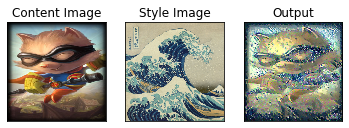

In [13]:
content_img = style_dataset.load_image("../../data/Teemo_6-300x545.jpg", device)
for i, style_img in enumerate(style_loader):
    if i == 3:
        break
        
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=300,
                            do_print=True, device=device)

fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "teemo")
plt.show()

# yasuo

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 170.180405 Content Loss: 30.983795

run [100]:
Style Loss : 55.219601 Content Loss: 29.845137

run [150]:
Style Loss : 37.101692 Content Loss: 28.570507

run [200]:
Style Loss : 27.207312 Content Loss: 26.852913

run [250]:
Style Loss : 20.098894 Content Loss: 25.167034

run [300]:
Style Loss : 14.139227 Content Loss: 23.883583

run [350]:
Style Loss : 9.593653 Content Loss: 22.820370

run [400]:
Style Loss : 6.249794 Content Loss: 21.888306

run [450]:
Style Loss : 4.186986 Content Loss: 21.037691

run [500]:
Style Loss : 3.103226 Content Loss: 20.382504



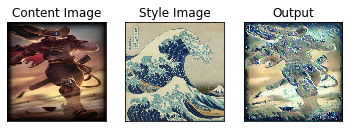

In [16]:
content_img = style_dataset.load_image("../../data/Yasuo_1-300x545.jpg", device)
for i, style_img in enumerate(style_loader):
    if i == 3:
        break
        
# squeeze batch dim
style_img = style_img.squeeze(0)
# input
input_img = content_img.clone()
# run style transfer
output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            content_img, style_img, input_img, num_steps=500,
                            do_print=True, device=device)

fig, axes = plt.subplots(1, 3)
for i in range(3):
    axes[i].get_xaxis().set_visible(False)
    axes[i].get_yaxis().set_visible(False)
imshow(content_img, axes[0], "Content Image")
imshow(style_img, axes[1], "Style Image")
imshow(output, axes[2], "Output")
plt.savefig(outfolder + "yasuo")
plt.show()

# grid of annie, kennen, mf

In [23]:
steps=300

annie_content = style_dataset.load_image("../../data/Annie_2-2.jpg", device)
for i, annie_style in enumerate(style_loader):
    if i == 5:
        break      
# squeeze batch dim
style_img = annie_style.squeeze(0)
# input
input_img = annie_content.clone()
# run style transfer
annie_output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            annie_content, style_img, input_img, num_steps=steps,
                            do_print=True, device=device)

kennen_content = style_dataset.load_image("../../data/Kennen_3.jpg", device)
for i, kennen_style in enumerate(style_loader):
    if i == 6:
        break

# squeeze batch dim
style_img = kennen_style.squeeze(0)
# input
input_img = kennen_content.clone()
# run style transfer
kennen_output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                            kennen_content, style_img, input_img, num_steps=steps,
                            do_print=True, device=device)

mf_path = "../../data/missfortuneloadscreen_17.skins_missfortune_skin15_chromas-300x545.jpg"
mf_content = style_dataset.load_image(mf_path, device)
for i, mf_style in enumerate(style_loader):
    pass
# squeeze batch dim
style_img = mf_style.squeeze(0)
# input
input_img = mf_content.clone()
# run style transfer
mf_output = run_style_transfer(cnn, cnn_normalization_mean, cnn_normalization_std,
                               mf_content, style_img, input_img, num_steps=steps,
                               do_print=True, device=device)

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 129.811386 Content Loss: 12.800230

run [100]:
Style Loss : 34.430817 Content Loss: 14.365285

run [150]:
Style Loss : 17.006260 Content Loss: 14.071899

run [200]:
Style Loss : 9.732504 Content Loss: 13.757502

run [250]:
Style Loss : 6.210957 Content Loss: 13.451834

run [300]:
Style Loss : 4.368737 Content Loss: 12.892010

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 1641.056396 Content Loss: 30.094206

run [100]:
Style Loss : 166.965622 Content Loss: 31.499680

run [150]:
Style Loss : 67.479836 Content Loss: 31.938110

run [200]:
Style Loss : 30.078299 Content Loss: 32.241798

run [250]:
Style Loss : 15.346261 Content Loss: 32.012203

run [300]:
Style Loss : 8.685400 Content Loss: 31.377113

Building the style transfer model..
Optimizing..
run [50]:
Style Loss : 132.862442 Content Loss: 19.042767

run [100]:
Style Loss : 44.277077 Content Loss: 18.662626

run [150]:
Style Loss : 28.88

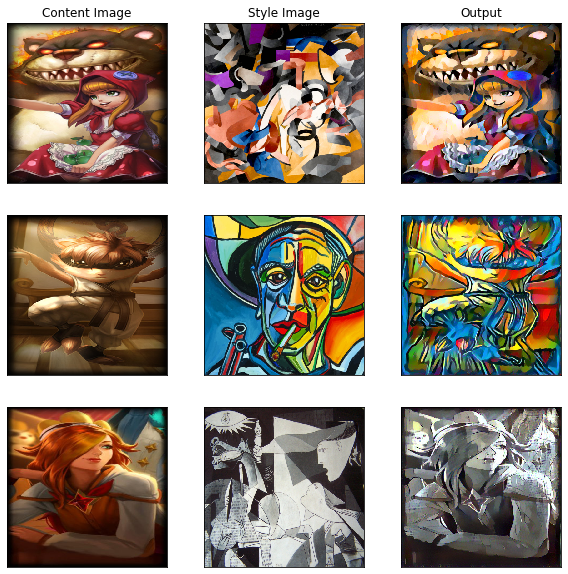

In [24]:
fig, axes = plt.subplots(3, 3, figsize=(10, 10))
for i in range(3):
    for j in range(3):
        axes[i][j].get_xaxis().set_visible(False)
        axes[i][j].get_yaxis().set_visible(False)
imshow(annie_content, axes[0][0], "Content Image")
imshow(annie_style, axes[0][1], "Style Image")
imshow(annie_output, axes[0][2], "Output")

imshow(kennen_content, axes[1][0])
imshow(kennen_style, axes[1][1])
imshow(kennen_output, axes[1][2])

imshow(mf_content, axes[2][0])
imshow(mf_style, axes[2][1])
imshow(mf_output, axes[2][2])

plt.savefig(outfolder + "annie_kennen_mf")
plt.show()